# Instacart Market Basket Analysis


In [4]:

%matplotlib inline

from wordcloud import *
import textblob
import numpy as np
from nltk import tokenize
from nltk.corpus import stopwords
from collections import Counter
import random
import string
import operator
import re
import pandas as pd
import math
import os
import networkx as nx
from matplotlib import pyplot
import matplotlib.pyplot as plt
import plotly as py
import plotly.graph_objs as go
import psycopg2
import seaborn as sbn
import requests
import textatistic
from IPython.display import display, Markdown
from bs4 import BeautifulSoup
py.offline.init_notebook_mode()

In [5]:
# aisles = pd.read_csv('/home/faculty/millbr02/pub/ecomm/aisles.csv')
# dept = pd.read_csv('/home/faculty/millbr02/pub/ecomm/departments.csv')
#opp = pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__prior.csv')
opt = pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__train.csv')
# orders = pd.read_csv('/home/faculty/millbr02/pub/ecomm/orders.csv')
products = pd.read_csv('/home/faculty/millbr02/pub/ecomm/products.csv')

In [31]:
msk = np.random.rand(len(opt)) < 0.8
train = opt[msk]
test = opt[~msk]

In [32]:
aco = train.groupby('order_id')

In [33]:
aco.get_group(36)['product_id']

9     19660
10    49235
11    43086
12    46620
13    34497
14    48679
Name: product_id, dtype: int64

In [34]:
unique_orderids = aco.groups.keys()

In [35]:
%%time
iimat = {}
for oid in unique_orderids:
    for product1 in aco.get_group(oid)['product_id']:
        if int(product1) not in iimat:
            iimat[int(product1)] = {}
        for product2 in aco.get_group(oid)['product_id']:
            if product1 != product2:
                iimat[int(product1)][int(product2)] = iimat[int(product1)].get(int(product2),0) +1

CPU times: user 8min 14s, sys: 4.88 s, total: 8min 19s
Wall time: 8min 19s


In [36]:
%%time
msofar = 0
ones =0
for key in iimat:
    for i in iimat[key]:
        if iimat[key][i]==1:
            ones += 1
        if iimat[key][i] > msofar:
            msofar = iimat[key][i]
            print(key,i,msofar)

1 30720 2
1 6184 6
1 21572 7
10 4138 18
25 13176 20
34 24852 39
45 24852 117
260 24852 209
260 21137 214
432 24852 247
4605 21903 351
4605 47626 485
4605 24852 679
4920 24852 722
13176 39275 742
13176 47209 1518
13176 21137 1918
CPU times: user 3.68 s, sys: 68 ms, total: 3.74 s
Wall time: 3.74 s


In [37]:
delkeys = []
for i in iimat.keys():
    for k,v in iimat[i].items():
        if v == 1:
            delkeys.append((i,k))

In [38]:
for i, j in delkeys:
    del iimat[i][j]

In [39]:
import json
with open('item_item.json', 'w') as f:
    json.dump(iimat,f)

In [ ]:
#t = pd.DataFrame(iimat).to_sparse()
t = pd.read_json('/home/faculty/millbr02/pub/item_item.json')
t.head()

In [45]:
def getval(d):
    return d[1]

recs = sorted(t[13176].items(), key=getval, reverse=True)

In [46]:
def predictor(mat, item1, item2):
    recs = list(mat[item1].items()) + list(mat[item2].items())
    recs= sorted(recs, key=getval, reverse = True)
    recs = [recs[x][0] for x in range(min(5, len(recs)))]
    recs = list(set(recs))
    return recs

In [47]:
for p in predictor(t, 13176,21137):
    print(products[products.product_id == p].product_name)
    

19271    Veganic Sprouted Brown Rice Cacao Crisps
Name: product_name, dtype: object
10007    Sheeps Milk Maple Yogurt
Name: product_name, dtype: object
10010    Baby Diapers Size 2
Name: product_name, dtype: object
10004    Potstickers, Organic, Pork & Vegetable
Name: product_name, dtype: object
10016    Tilapia Filet
Name: product_name, dtype: object


In [51]:
#for p in predictor(t,13176,21137):
    #print(products[products.product_id])

In [58]:
test = pd.read_csv('/home/faculty/millbr02/pub/mytest.csv')


In [52]:
tco = train.groupby('order_id')

# Prediction Precent Correct

In [55]:
hits = 0
count = 0
for order in tco.groups.keys():
    contents = list(tco.get_group(order).sort_values('add_to_cart_order').product_id)
    if len(contents) > 2:
        count += 1
        recs = predictor(iimat, contents[0], contents[1])
        basket = set(contents[3:])
        recs = set(recs)
        correct_recs = recs.intersection(basket)
        if len(correct_recs) >= 1:
            hits += 1
            
            
print(hits, count, hits/count)

24989 110905 0.22531896668319734


# Aisles

In [6]:
#merge products and training set
merge1 = products.merge(opt).sort_values(by='order_id').reset_index(drop=True)

In [7]:
merge2 = merge1.set_index(["order_id"]).reset_index()
#reset index to order_id

In [8]:
grouped = merge2.groupby('order_id')
#group by order_id

In [9]:
grouped.get_group(1).sort_values(by='add_to_cart_order').reset_index(drop=True)

,order_id,product_id,product_name,aisle_id,department_id,add_to_cart_order,reordered
0,1,49302,Bulgarian Yogurt,120,16,1,1
1,1,11109,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,16,2,1
2,1,10246,Organic Celery Hearts,83,4,3,0
3,1,49683,Cucumber Kirby,83,4,4,0
4,1,43633,Lightly Smoked Sardines in Olive Oil,95,15,5,1
5,1,13176,Bag of Organic Bananas,24,4,6,0
6,1,47209,Organic Hass Avocado,24,4,7,0
7,1,22035,Organic Whole String Cheese,21,16,8,1


In [10]:
%%time
aisles_to_aisles = {}
for i in list(set(merge2.order_id)):
    
    # get group by object for each order_id then sort by order added to cart
    grouped2 = grouped.get_group(i).sort_values(by='add_to_cart_order').reset_index(drop=True)
    
    aisles_list = list(grouped2.aisle_id)
    
    #create the aisle to aisle matrix
    for item in list(zip(aisles_list,aisles_list[1:])):
        if item[0] not in aisles_to_aisles:
            aisles_to_aisles[item[0]] = {item[1]:1}
        else:
            if item[1] not in aisles_to_aisles[item[0]]:
                aisles_to_aisles[item[0]][item[1]] = 1
            else:
                aisles_to_aisles[item[0]][item[1]] += 1

CPU times: user 2min 18s, sys: 460 ms, total: 2min 18s
Wall time: 2min 18s


In [11]:
#replace nans with 0's
nonans = pd.DataFrame(aisles_to_aisles).fillna(0)

In [12]:
nonans.head()

,1,2,3,4,5,6,7,8,9,10,...,125,126,127,128,129,130,131,132,133,134
1,188.0,5.0,34.0,21.0,6.0,6.0,4.0,7.0,16.0,0.0,...,2.0,2.0,1.0,16.0,19.0,15.0,12.0,0.0,1.0,0.0
2,12.0,134.0,23.0,21.0,6.0,2.0,9.0,3.0,44.0,2.0,...,2.0,0.0,2.0,28.0,24.0,8.0,55.0,1.0,2.0,2.0
3,23.0,19.0,4483.0,85.0,13.0,17.0,8.0,13.0,75.0,0.0,...,44.0,11.0,11.0,41.0,67.0,76.0,59.0,1.0,5.0,0.0
4,18.0,28.0,78.0,1164.0,41.0,11.0,17.0,10.0,116.0,3.0,...,10.0,7.0,13.0,52.0,110.0,45.0,132.0,1.0,9.0,1.0
5,6.0,12.0,21.0,42.0,91.0,5.0,6.0,2.0,41.0,2.0,...,0.0,0.0,2.0,24.0,31.0,10.0,25.0,0.0,2.0,0.0


In [13]:
#greater = nonans[nonans.values > 2]

# Heatmap of Aisle to Aisle matrix

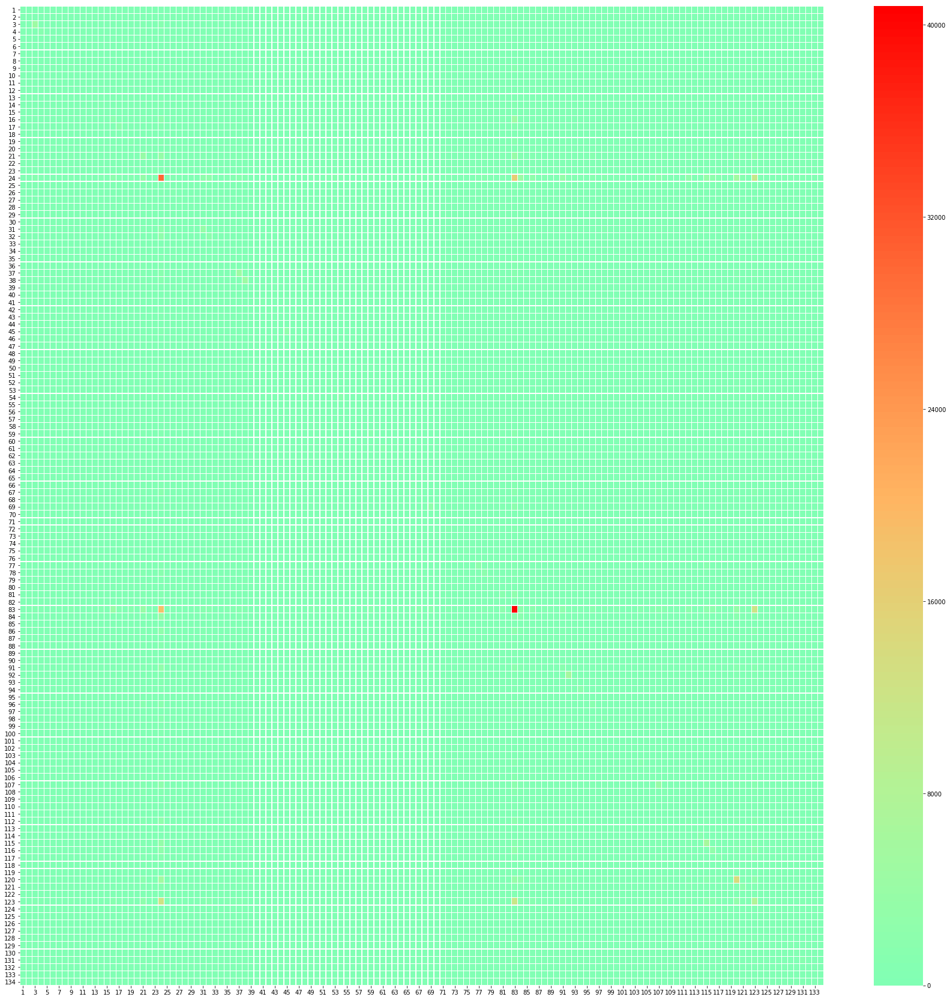

In [63]:

size = (30, 30)
fig, ax = pyplot.subplots(figsize=size)
ax = sbn.heatmap(nonans, vmin=0,center=0, linewidths=.2,cmap="rainbow")

# Network Graph of the Aisles to Aisles matrix


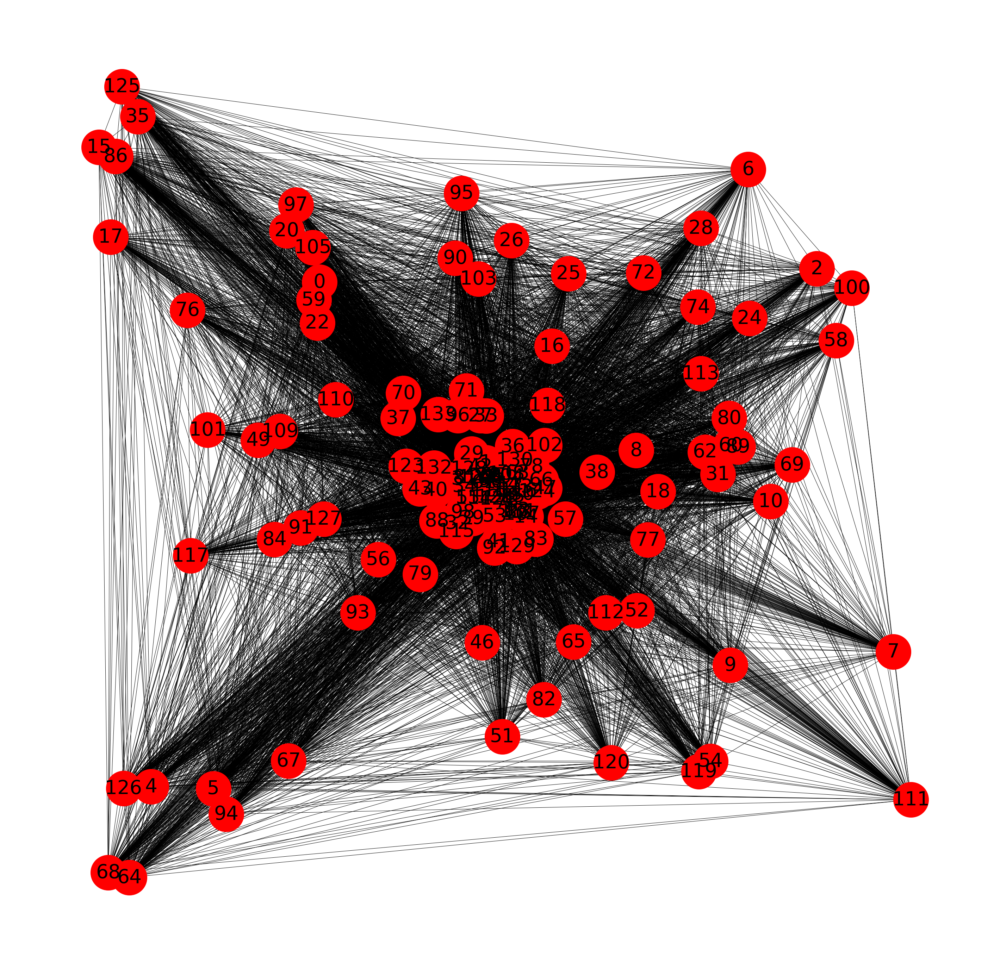

In [47]:
#network graph of the aisles
import numpy
A=numpy.matrix(nonans)
G=nx.from_numpy_matrix(A)
G.edges(data=True)
Gfig, gax = plt.subplots(figsize = (50,50))
nx.draw(G,nx.spring_layout(G, iterations=5), ax=gax, with_labels=True, node_size=10000, font_size = 55)